In [1]:
import pathlib
import cdmetadl.helpers.general_helpers
import cdmetadl.dataset
import cdmetadl.samplers
import cdmetadl.augmentation
from cdmetadl.notebooks.helpers import generate_edge_map_plot

%load_ext autoreload
%autoreload 2
%matplotlib inline  

/fastdata/vilab25/cd-metadl-cyLvmR8c-py3.11/lib/python3.11/site-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/fastdata/vilab25/cd-metadl-cyLvmR8c-py3.11/lib/python3.11/site-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_5m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_5m_224. This is because the name being registered conflicts with an existing name. Please check if this is not expected.
  return register_model(fn_wrapper)
/fastdata/vilab25/cd-metadl-cyLvmR8c-py3.11/lib/python3.11/site-packages/controlnet_aux/segment_anything/modeling/tiny_vit_sam.py:654: UserWarning: Overwriting tiny_vit_11m_224 in registry with controlnet_aux.segment_anything.modeling.tiny_vit_sam.tiny_vit_11m_224. This is becau

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

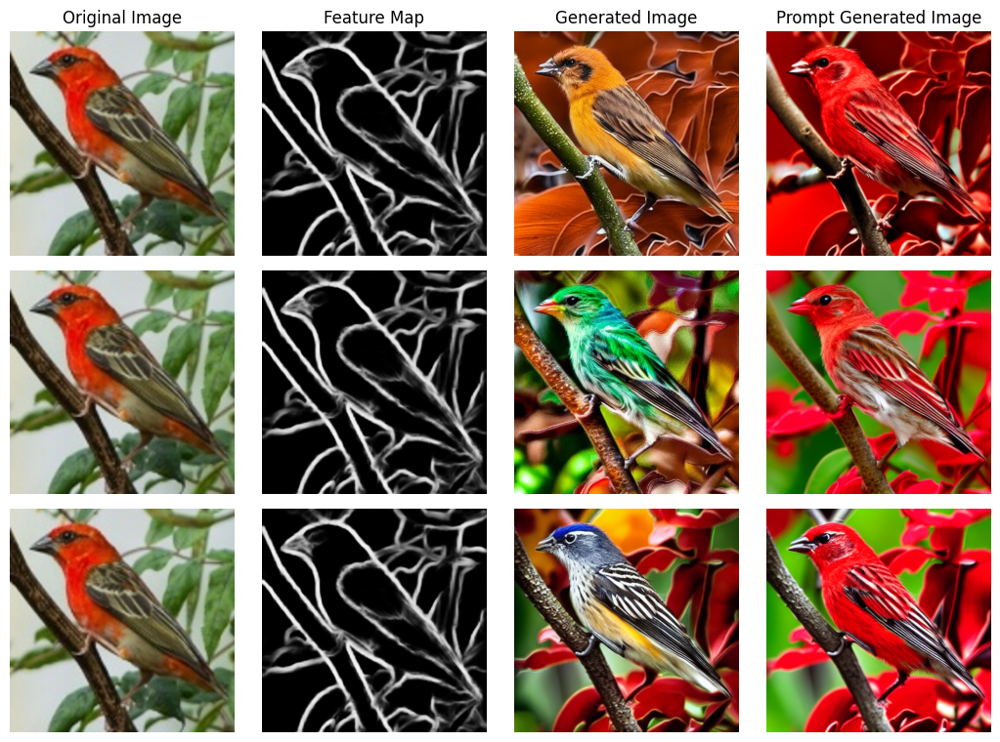

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

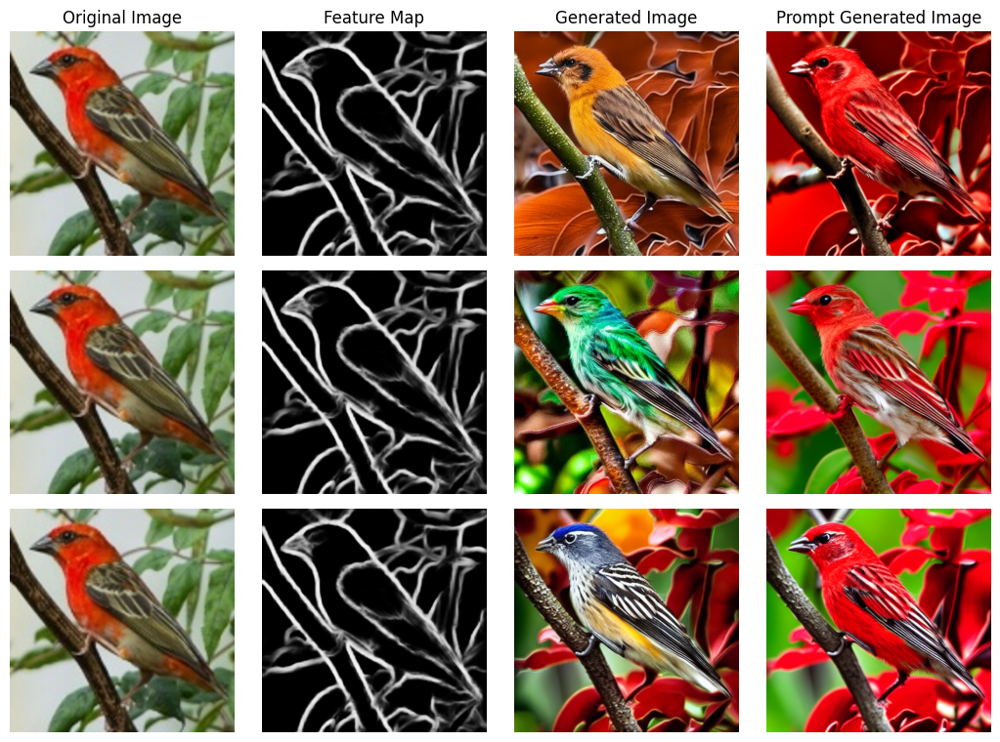

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

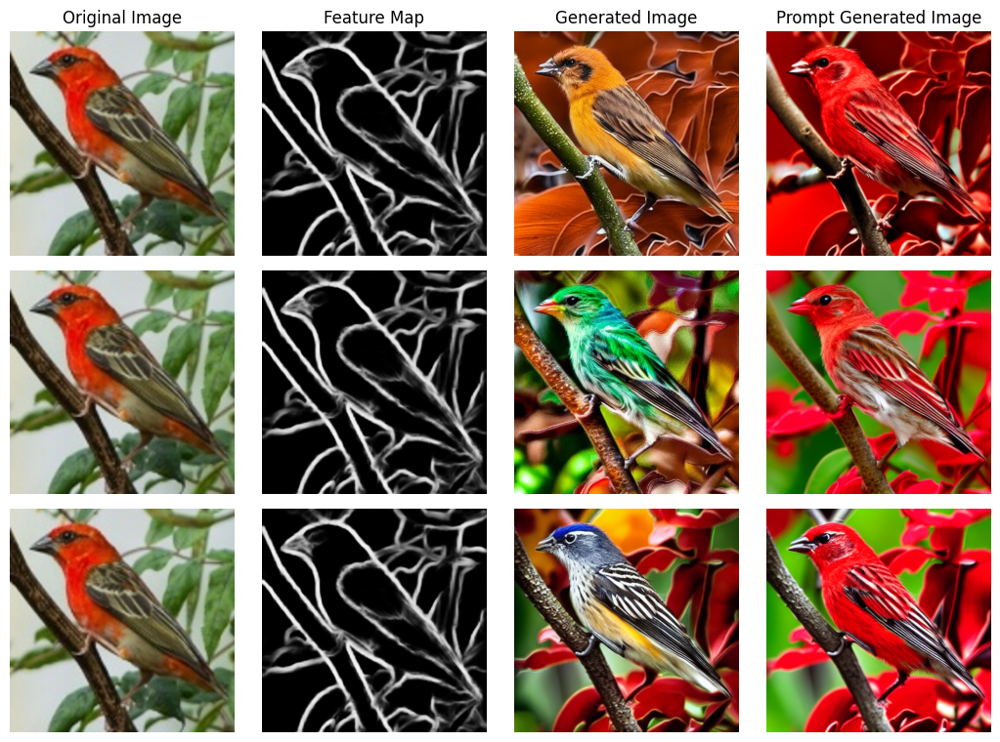

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

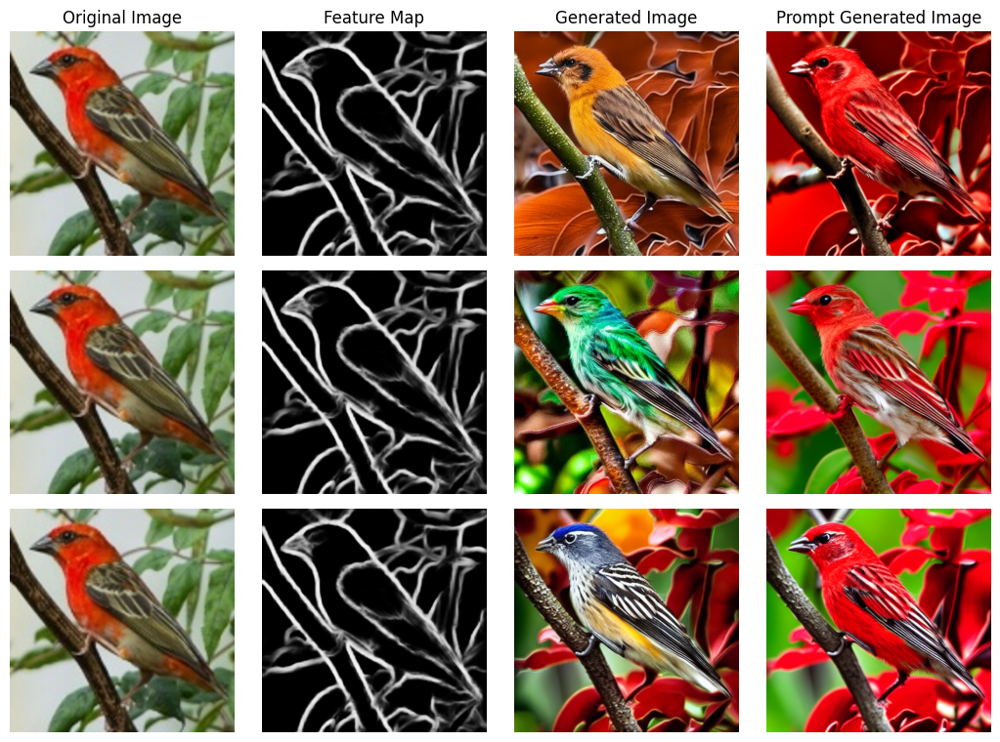

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

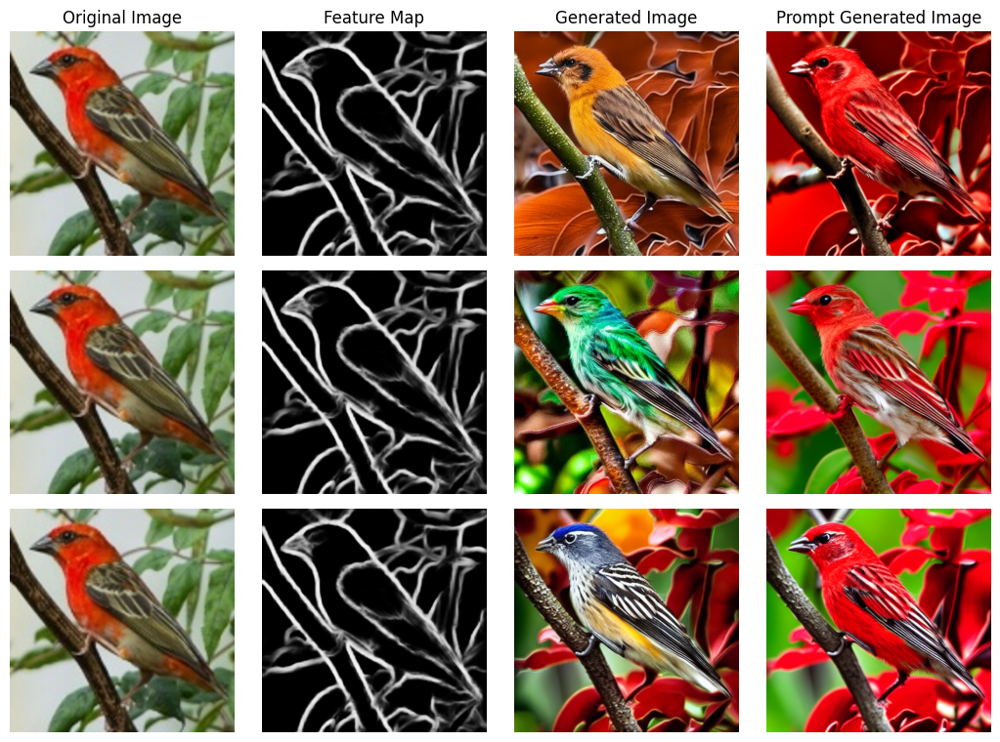

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

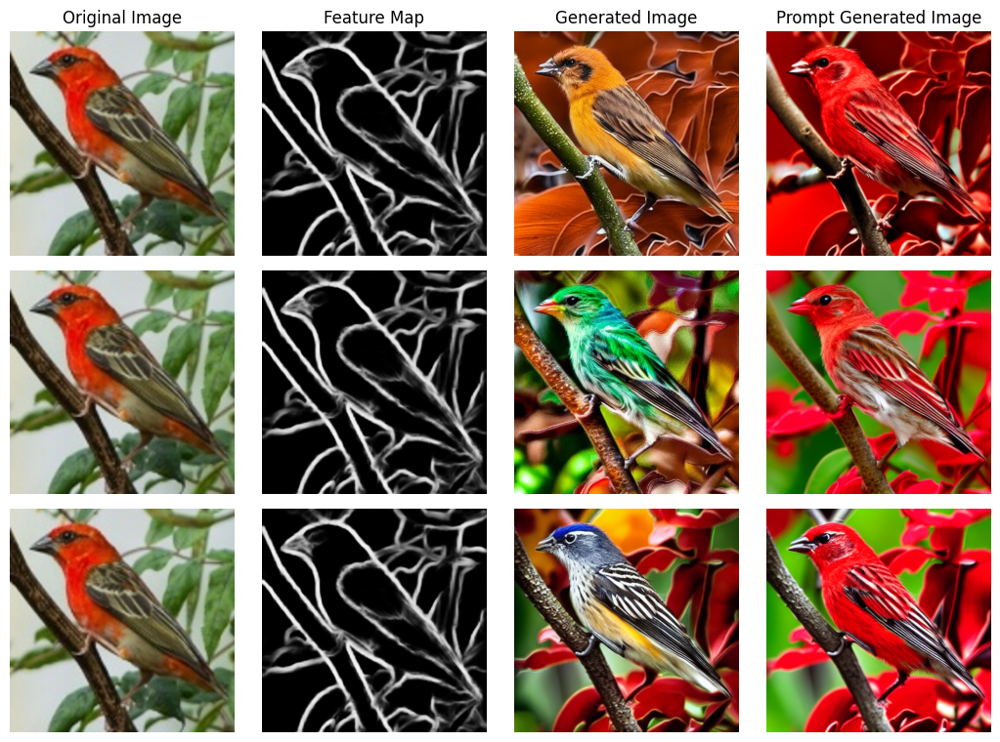

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

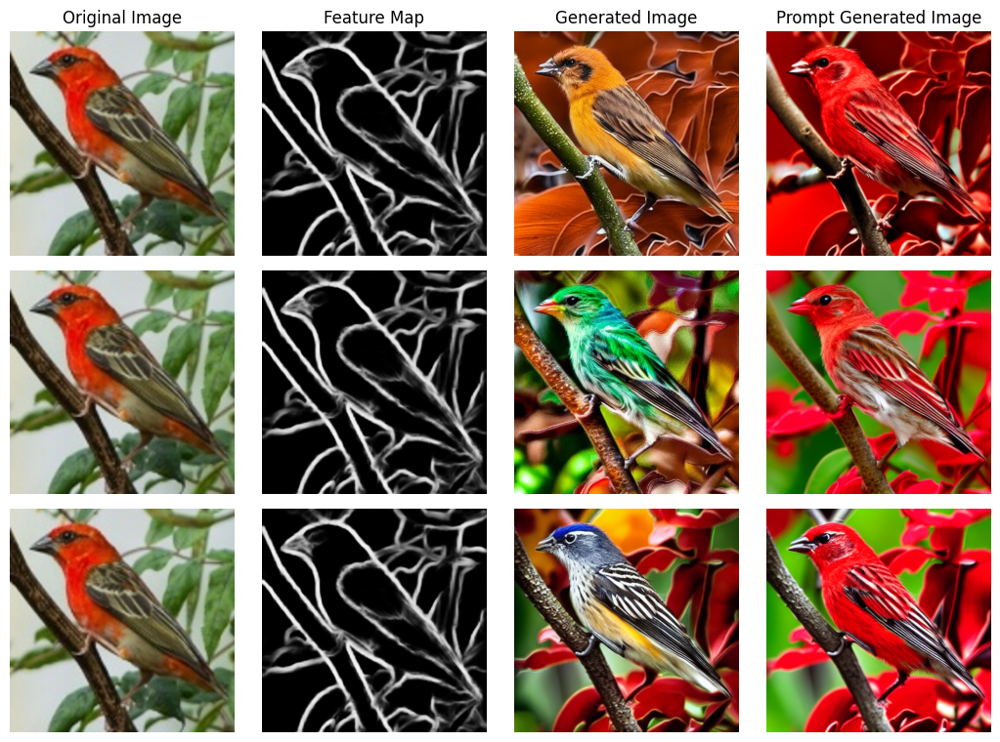

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

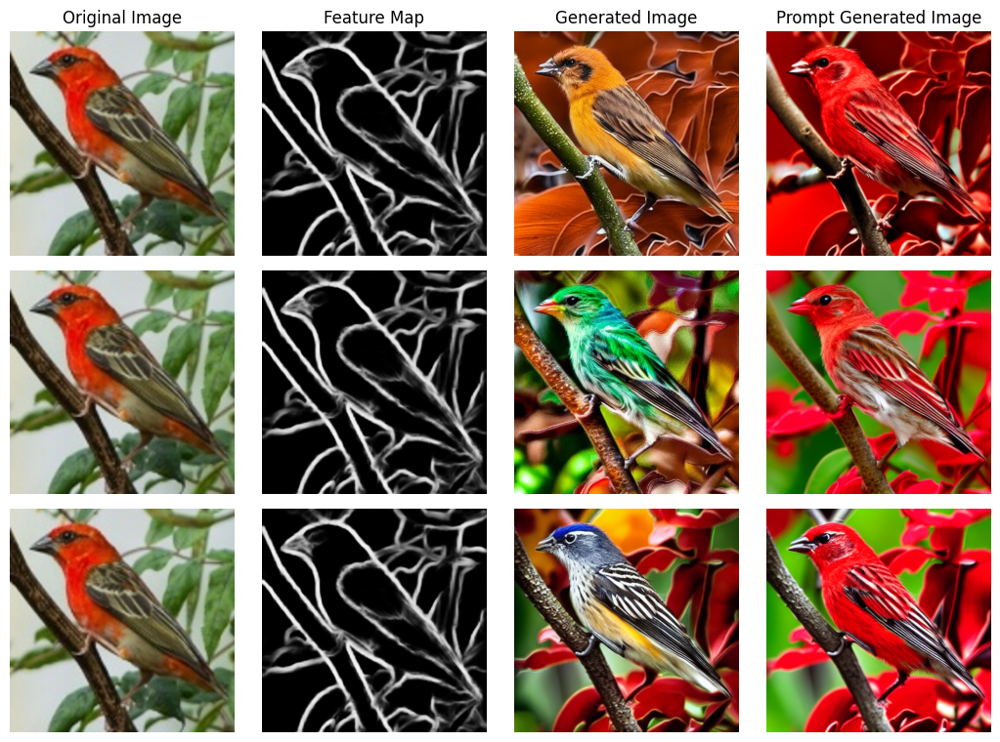

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
path_to_dataset = "/fastdata/vilab24/meta-album"

for _ in range(1):
    dataset_path = pathlib.Path(path_to_dataset)
    dataset_info_dict = cdmetadl.helpers.general_helpers.check_datasets(dataset_path, ["BRD"])

    dataset = cdmetadl.dataset.ImageDataset("Birds", dataset_info_dict["BRD"])

    n_way_sampler = cdmetadl.samplers.ValueSampler(value=1)
    k_shot_sampler = cdmetadl.samplers.ValueSampler(value=1)

    task = dataset.generate_task(n_way_sampler, k_shot_sampler, query_size=4)

    augmentation_size = {"threshold": 0.75,
                        "scale": 1,
                        "offset": 1,
                        "maximum": 2}

    device = "cuda:1"


    generated_images = []

    generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(augmentation_size,
                                                                        device=device,
                                                                        annotator_type="hed",
                                                                        keep_original_data=False,
                                                                        cache_images=True,
                                                                        guessing_mode=True)

    for i in range(3): 
        generative_augmentor.augment(task.support_set, conf_scores=task.number_of_ways*[0.1])
        generated_images.append(generative_augmentor.generated_images[i])


    prompt_images = []

    generative_augmentor = cdmetadl.augmentation.GenerativeAugmentation(augmentation_size,
                                                                        device=device,
                                                                        annotator_type="hed",
                                                                        keep_original_data=False,
                                                                        cache_images=True,
                                                                        guessing_mode=False)

    for i in range(3): 
        generative_augmentor.augment(task.support_set, conf_scores=task.number_of_ways*[0.1])
        generated_images[i]["prompt_generated_image"] = generative_augmentor.generated_images[i]['generated_image']
        
    # Create a plot that shows all prompt_images and all non_prompt images and states which is which,
    # make one row for the prompt images and one row for the non-prompt images
    import matplotlib.pyplot as plt

    fig, axes = plt.subplots(3, 4, figsize=(15*0.7, 11*0.7))

    # Set titles
    titles = ['Original Image', 'Feature Map', 'Generated Image', 'Prompt Generated Image']
    for ax, title in zip(axes[0], titles):
        ax.set_title(title)

    for i, entry in enumerate(generated_images):
        axes[i, 0].imshow(entry['original_image'])
        axes[i, 0].axis('off')
        axes[i, 1].imshow(entry['feature_map'])
        axes[i, 1].axis('off')
        axes[i, 2].imshow(entry['generated_image'])
        axes[i, 2].axis('off')
        axes[i, 3].imshow(entry['prompt_generated_image'])
        axes[i, 3].axis('off')

    plt.tight_layout()
    plt.show()
